# ATERA WTA FFPE breast cancer

Tutorial notebook for the **ATERA WTA FFPE breast cancer** 10x image-based spatial transcriptomics dataset (170,057 cells × 18,028 genes, whole-transcriptome add-on panel), starting from the **raw `outs/` bundle** straight off the instrument (no pre-processed `.h5ad`).

**Analysis outline:**

0. Load raw data (`spatialdata_io.xenium`) + build the spatial graph
1. Segmentation quality diagnostics
2. Preprocessing  
   2.1 QC,  
   2.2 normalization
3. Cell type annotation
4. Spatial structure —  
   4.1 spatially aware clustering (niches),  
   4.2 niche characterization,  
   4.3 co-occurrence / neighborhood enrichment / ligand-receptor signaling
6. Spatially variable genes & gene-level tasks
7. Visualization strategies (incl. zoomed tissue regions)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import anndata as ad
import scanpy as sc
import squidpy as sq 
import rapids_singlecell as rsc

import spatialdata as sd
import spatialdata_io as sio
import spatialdata_plot 

sns.set_style("whitegrid")
plt.rcParams["figure.dpi"] = 110

In [2]:
# Download the `..._outs.zip` bundle from the public 10x dataset page:
# https://www.10xgenomics.com/datasets/atera-wta-ffpe-human-breast-cancer
# (CC BY 4.0), then point DATA_ROOT at the folder you downloaded it into.
DATA_ROOT = Path("./data/atera")
ZIP_PATH = DATA_ROOT / "WTA_Preview_FFPE_Breast_Cancer_outs.zip"
OUTS_DIR = DATA_ROOT / "outs"

RANDOM_STATE = 0

## 0. Load the raw Atera `outs/` bundle

Everything downstream in this tutorial starts here: no cached
`.h5ad`. 
- `spatialdata_io.xenium` parses the on-instrument output
directory (`cell_feature_matrix.h5`, `cells.parquet`,
`cell_boundaries.parquet`, morphology OME-TIFFs, `experiment.xenium`,
...) into a single `SpatialData` object with aligned images, cell
shapes, and an expression table in one coordinate system.
- We keep `cells_boundaries=True` and `morphology_focus=True` here so the
`SpatialData` object can also drive zoomed-region figures, everything else (`transcripts`, `*_labels`, `morphology_mip`, `aligned_images`) is switched off since this tutorial works at the cell-table level, not the transcript/pixel level.

In [3]:
REQUIRED_OUTS_FILES = [
    "experiment.xenium",
    "cell_feature_matrix.h5",
    "cells.parquet",
    "cell_boundaries.parquet",
    "nucleus_boundaries.parquet",
    "cells.zarr.zip",
    "metrics_summary.csv",
    "morphology_focus",
]


def extract_required_files(zip_path: Path, outs_dir: Path) -> list[str]:
    """Extract only missing required members from the outs zip, if present."""
    missing = [name for name in REQUIRED_OUTS_FILES if not (outs_dir / name).exists()]
    if not missing or not zip_path.exists():
        return []
    outs_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path) as zf:
        members = [m for m in zf.namelist() if any(m.startswith(name) for name in missing)]
        zf.extractall(outs_dir, members=members)
    return missing


extracted = extract_required_files(ZIP_PATH, OUTS_DIR)
if extracted:
    print(f"Extracted {len(extracted)} missing item(s) into {OUTS_DIR}")
else:
    print(f"Using already-extracted outs/ at {OUTS_DIR}")

Using already-extracted outs/ at data/atera/outs


In [4]:
sdata = sio.xenium(
    OUTS_DIR,
    cells_boundaries=True,       # -> Shapes["cell_boundaries"]
    nucleus_boundaries=False,
    cells_as_circles=False,
    cells_labels=False,
    nucleus_labels=False,
    transcripts=False,           # transcript-level table not needed for this tutorial
    morphology_mip=False,
    morphology_focus=True,       # -> Images["morphology_focus"]
    aligned_images=False,
    cells_table=True,            # -> Tables["table"], the cell x gene AnnData
    gex_only=True,               # keep Gene Expression features only (drop control probes as var rows)
)
sdata

/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/spatialdata/_core/spatialdata.py:170: UserWarning: The table is annotating 'cell_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)


SpatialData object
├── Images
│     └── 'morphology_focus': DataTree[cyx] (4, 28048, 46543), (4, 14024, 23271), (4, 7012, 11635), (4, 3506, 5817), (4, 1753, 2908)
├── Shapes
│     └── 'cell_boundaries': GeoDataFrame shape: (170057, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (170057, 18028)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_boundaries (Shapes)

### Prepare AnnData from SpatialData object

spatialdata-plot needs the table to annotate the shapes element it will be rendered against. 
- By default the table's region metadata points at the label image we didn't load (`cells_labels`), so we repoint it at the cell-boundary polygons we did load (`cell_boundaries`).
- Move the AnnData object to GPU.

In [5]:
table = sdata.tables["table"]
table.obs["region"] = pd.Categorical(["cell_boundaries"] * table.n_obs)
sdata.set_table_annotates_spatialelement(
    "table", region="cell_boundaries", region_key="region", instance_key="cell_id"
)

adata = sdata.tables["table"].copy()
adata.var_names_make_unique()
adata.layers["counts"] = adata.X.copy()  # keep raw counts around explicitly

rsc.get.anndata_to_GPU(adata, convert_all=True)
adata

AnnData object with n_obs × n_vars = 170057 × 18028
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'
    layers: None (.X), 'counts'

## 1. Segmentation quality diagnostics

We don't re-run segmentation here; instead we audit its output with the per-cell metrics Atera reports, which double as classic imaging-QC "diagnostic
plots":

- `cell_area`, `nucleus_area`, and their ratio — implausibly large/small
  cells or nucleus/cell ratios flag over/under-segmentation.
- `nucleus_count` — 0 nuclei (likely debris/fragment) or ≥2 nuclei
  (likely a merged/under-segmented cell).
- `segmentation_method` — which fallback tier was used per cell; a high
  share of "nucleus expansion" fallback in a region suggests weaker
  boundary-stain signal there.
- negative-control / codeword counts as a fraction of total counts — a
  proxy for transcript misassignment / optical crosstalk, not just
  expression QC.

In [6]:
obs = adata.obs

obs["nucleus_to_cell_area"] = obs["nucleus_area"] / obs["cell_area"]
obs["control_total"] = (
    obs["control_probe_counts"]
    + obs["control_codeword_counts"]
    + obs["genomic_control_counts"]
    + obs["unassigned_codeword_counts"]
    + obs["deprecated_codeword_counts"]
)
obs["pct_control"] = 100 * obs["control_total"] / (obs["transcript_counts"] + obs["control_total"]).clip(lower=1)
obs["transcripts_per_area"] = obs["transcript_counts"] / obs["cell_area"]

obs[[
    "cell_area", "nucleus_area", "nucleus_to_cell_area", "nucleus_count",
    "transcript_counts", "control_total", "pct_control", "transcripts_per_area",
]].describe()

,cell_area,nucleus_area,nucleus_to_cell_area,nucleus_count,transcript_counts,control_total,pct_control,transcripts_per_area
count,170057.000000,168335.000000,168335.000000,170057.000000,170057.000000,170057.000000,170057.000000,170057.000000
mean,79.558482,36.355390,0.483357,0.995507,2948.304610,2.060397,0.077598,35.196268
std,53.652394,25.052093,0.185783,0.126994,2560.953667,2.249904,0.098925,16.389347
min,1.806118,1.490047,0.010481,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.901928,17.790258,0.348526,1.000000,1096.000000,0.000000,0.000000,22.745518
50%,64.929928,30.071858,0.483871,1.000000,2116.000000,1.000000,0.057954,34.675475
75%,103.084162,48.990940,0.617730,1.000000,4158.000000,3.000000,0.107914,46.530242
max,743.849531,324.739943,1.000000,3.000000,26078.000000,37.000000,6.666667,107.833089


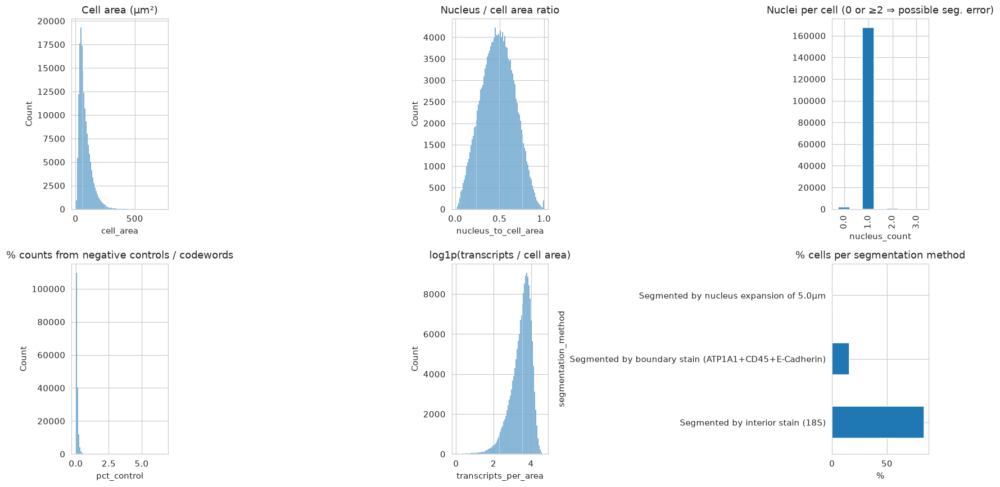

In [7]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

sns.histplot(obs["cell_area"], bins=80, ax=axes[0, 0])
axes[0, 0].set_title("Cell area (µm²)")

sns.histplot(obs["nucleus_to_cell_area"].clip(upper=1.5), bins=80, ax=axes[0, 1])
axes[0, 1].set_title("Nucleus / cell area ratio")

obs["nucleus_count"].value_counts().sort_index().plot(kind="bar", ax=axes[0, 2])
axes[0, 2].set_title("Nuclei per cell (0 or ≥2 ⇒ possible seg. error)")

sns.histplot(obs["pct_control"], bins=80, ax=axes[1, 0])
axes[1, 0].set_title("% counts from negative controls / codewords")

sns.histplot(np.log1p(obs["transcripts_per_area"]), bins=80, ax=axes[1, 1])
axes[1, 1].set_title("log1p(transcripts / cell area)")

obs["segmentation_method"].value_counts(normalize=True).mul(100).plot(
    kind="barh", ax=axes[1, 2]
)
axes[1, 2].set_title("% cells per segmentation method")
axes[1, 2].set_xlabel("%")

fig.tight_layout()
plt.show()

... storing 'segmentation_method' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


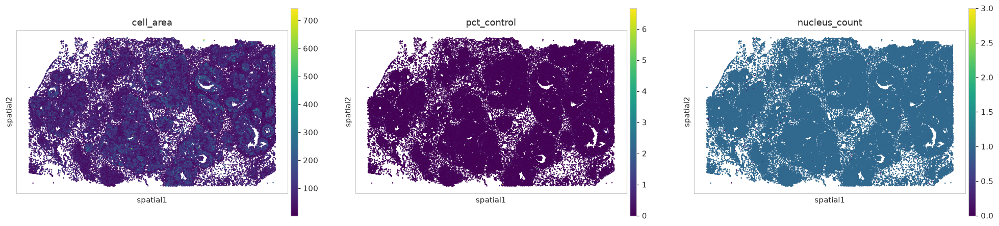

In [8]:
sq.pl.spatial_scatter(
    adata, 
    library_id='region',
    color=["cell_area", "pct_control", "nucleus_count"],
    shape=None, 
    img=False, 
    cmap="viridis", 
    ncols=3 
)

## 2. Preprocessing

### 2.1 Quality control

We compute standard QC metrics with `rsc.pp.calculate_qc_metrics`
(GPU) and use percentile-based thresholds as an illustrative starting
point. 

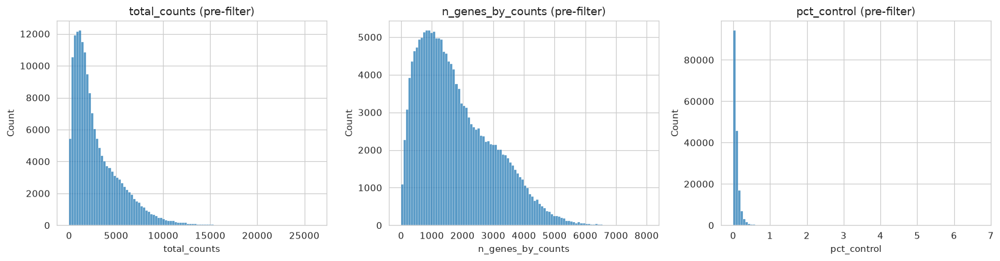

In [9]:
rsc.pp.calculate_qc_metrics(
    adata, 
    expr_type="counts", 
    var_type="genes", 
    log1p=True
)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], bins=100, ax=axes[0])
axes[0].set_title("total_counts (pre-filter)")
sns.histplot(adata.obs["n_genes_by_counts"], bins=100, ax=axes[1])
axes[1].set_title("n_genes_by_counts (pre-filter)")
sns.histplot(adata.obs["pct_control"], bins=100, ax=axes[2])
axes[2].set_title("pct_control (pre-filter)")
fig.tight_layout()

In [10]:
# Drop failed segmentations: empty cells and anucleate fragments.

keep = (adata.obs["total_counts"] >= 10) & (adata.obs["nucleus_count"] >= 1)
adata = adata[keep].copy()
rsc.pp.filter_genes(adata, min_cells=3)

### 2.2 Normalization and dimensionality reduction 

- We use the standard scanpy-style size-factor normalization; used as the
single normalized layer (`lognorm`) for everything downstream.
- We choose 2000 HVG and 50 PCs. 

In [11]:
rsc.pp.normalize_total(adata)
rsc.pp.log1p(adata)
adata.layers["lognorm"] = adata.X.copy()

In [12]:
rsc.pp.highly_variable_genes(
    adata, 
    n_top_genes=2000, 
    flavor="seurat_v3", 
    layer="counts"
)

rsc.pp.pca(
    adata, 
    n_comps=50, 
    mask_var="highly_variable", 
    random_state=RANDOM_STATE
)

## Build spatial graph 

we use `squidpy.gr.spatial_neighbors` stays CPU-only (no `rapids_singlecell` graph builder yet); it operates on `adata.obsm["spatial"]`, which is unaffected by the GPU move above.

In [13]:
sq.gr.spatial_neighbors_delaunay(adata, percentile=99)

INFO     Creating graph using `None` transform and `1` libraries.                                                  


## 3. Cell type annotation

We use a **marker-gene-set scoring** approach via `rsc.dcg.ulm` (decoupler_gpu's univariate linear model.

Scores are averaged within each unsupervised leiden cluster and the label is assigned by `argmax` on the cluster means.
Averaging over a cluster is far more robust than scoring each cell independently.

**Marker panel**, merging two sources for this specific breast-cancer dataset:

- **Normal lineage compartments** (epithelial, stromal, immune, vascular) from the Human Breast Cell Atlas (Kumar, Nee, Wei et al.,
  *Nature* 2023) — `LumHR`/`LumSec`/basal-myoepithelial for the three normal epithelial lineages, plus fibroblast/pericyte, T/B/plasma/myeloid/mast, and vascular/lymphatic endothelial.
- **Tumor substates** reported for *this* dataset in the 10x "Atera-Apps" poster (breast-cancer section): basal-like vs. luminal-like DCIS (`KIT`/`PROM1` vs. `ANKRD30A`/`ESR1`), a hypoxic tumor state (`CA9`/`HIF1A`/`SLC2A1`/`NDRG1`/`ODAM`), an invasive/11q13-amplicon state (`CCND1` + amplicon neighbors), and apocrine carcinoma (`PIP`).

In [14]:
CELL_TYPE_MARKERS: dict[str, list[str]] = {
    # -- normal epithelial lineages (HBCA, Kumar/Nee/Wei et al. 2023) --
    "LumHR_Epithelial": ["ESR1", "PGR", "AR", "FOXA1", "GATA3"],
    "LumSec_Epithelial": ["KIT", "ELF5", "SLPI"],
    "Basal_Myoepithelial": ["KRT5", "KRT14", "TP63", "ACTA2", "MYLK", "OXTR"],
    # -- tumor substates (10x Atera-Apps poster, breast-cancer section) --
    "Tumor_Basal_like_DCIS": ["KIT", "PROM1"],
    "Tumor_Luminal_like_DCIS": ["ANKRD30A", "ESR1"],
    "Tumor_Hypoxic": ["CA9", "HIF1A", "SLC2A1", "NDRG1", "ODAM"],
    "Tumor_Invasive_11q13amp": ["CCND1", "ANO1", "CTTN", "FADD"],
    "Tumor_Apocrine": ["PIP", "AR"],
    # -- stroma / vasculature (HBCA) --
    "Fibroblast_CAF": ["PDGFRA", "COL1A1", "COL1A2", "DCN", "LUM", "FAP", "POSTN"],
    "Pericyte_Perivascular": ["RGS5", "PDGFRB", "NOTCH3"],
    "Vascular_Endothelial": ["PECAM1", "VWF", "CLDN5", "CDH5"],
    "Lymphatic_Endothelial": ["PROX1", "LYVE1", "PDPN"],
    # -- immune (HBCA) --
    "T_Cell": ["CD3D", "CD3E", "CD2", "CD8A", "CD4", "IL7R"],
    "B_Cell": ["MS4A1", "CD79A", "CD79B"],
    "Plasma_Cell": ["MZB1", "JCHAIN", "IGHG1"],
    "Myeloid": ["CD68", "CD14", "LYZ", "ITGAX", "C1QA", "C1QB"],
    "Mast_Cell": ["TPSAB1", "TPSB2", "CPA3"],
}

celltype_net = (
    pd.Series(CELL_TYPE_MARKERS).explode().rename_axis("source").reset_index(name="target")
)
celltype_net.groupby("source").size()

source
B_Cell                     3
Basal_Myoepithelial        6
Fibroblast_CAF             7
LumHR_Epithelial           5
LumSec_Epithelial          3
Lymphatic_Endothelial      3
Mast_Cell                  3
Myeloid                    6
Pericyte_Perivascular      3
Plasma_Cell                3
T_Cell                     6
Tumor_Apocrine             2
Tumor_Basal_like_DCIS      2
Tumor_Hypoxic              5
Tumor_Invasive_11q13amp    4
Tumor_Luminal_like_DCIS    2
Vascular_Endothelial       4
dtype: int64

In [15]:
adata.X = adata.layers["lognorm"]

rsc.dcg.ulm(adata, celltype_net, layer="lognorm", tmin=2)
adata.obsm["score_celltype"] = adata.obsm.pop("score_ulm")
adata.obsm.pop("padj_ulm", None)

score_ct = adata.obsm["score_celltype"]

In [16]:
rsc.pp.neighbors(adata, n_neighbors=15, use_rep="X_pca", random_state=RANDOM_STATE)
rsc.tl.leiden(adata, resolution=1.0, key_added="leiden_expr", random_state=RANDOM_STATE)
rsc.tl.umap(adata, random_state=RANDOM_STATE)

In [17]:
# Robust label: mean decoupler score per expression cluster
cluster_mean_score = score_ct.groupby(adata.obs["leiden_expr"].values).mean()
cluster_to_celltype = cluster_mean_score.idxmax(axis=1)

adata.obs["cell_type"] = (
    adata.obs["leiden_expr"].map(cluster_to_celltype).astype("category")
)

adata.obs["cell_type"].value_counts()

cell_type
Tumor_Invasive_11q13amp    84734
Fibroblast_CAF             29868
LumHR_Epithelial           12366
Vascular_Endothelial       10894
T_Cell                     10039
Myeloid                     7563
Tumor_Basal_like_DCIS       5899
Pericyte_Perivascular       5240
Plasma_Cell                 1285
Tumor_Luminal_like_DCIS      415
Name: count, dtype: int64

<Axes: title={'center': 'Cell type (cluster-level argmax)'}, xlabel='UMAP1', ylabel='UMAP2'>

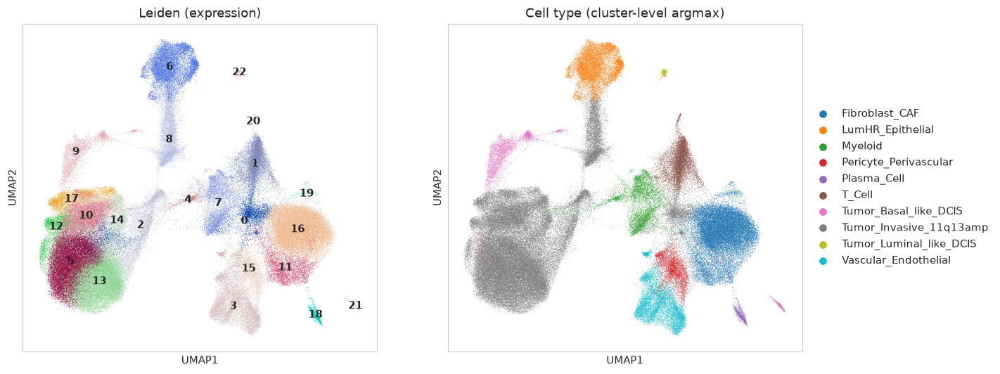

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))
sc.pl.umap(adata, color="leiden_expr", ax=axes[0], show=False, legend_loc="on data", title="Leiden (expression)")
sc.pl.umap(adata, color="cell_type", ax=axes[1], show=False, title="Cell type (cluster-level argmax)")

/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_spatial_utils.py:979: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


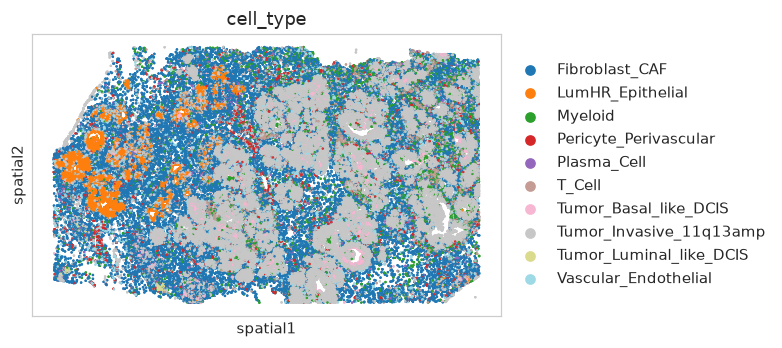

In [ ]:
sq.pl.spatial_scatter(
    adata, color="cell_type", shape=None, img=False,
    palette="tab20", size=1.5, figsize=(7, 6),
)

## 4. Identifying spatial structure

### 4.1 Spatially aware clustering (spatial domains / niches)

- Aggregation in PCA space, not raw expression. `calculate_niche`'s default path aggregates the full gene expression matrix as a sparse × sparse product. At 170k cells × 18k genes that SpGEMM exceeds a cuSPARSE internal limit (`CUSPARSE_STATUS_INSUFFICIENT_RESOURCES`). Passing the dense 50-component X_pca from Section 2.2 as the matrix to aggregate turns each shell product into a cheap sparse × dense matmul, and matches the original CellCharter paper, which aggregates in PCA space rather than over raw counts.

- Choosing `k`. `n_components` is fixed per run; there is no selection helper in the installed `rapids_singlecell` release yet (a GPU stability-based selector, `gr.cluster_autok`, is being upstreamed). We use k=9, fine enough to separate tumor, stromal, and immune sub-niches while staying interpretable, and in the same range as the ~10 spatial clusters reported for this dataset in the 10x poster's neighborhood analysis.

In [ ]:
# CellCharter aggregates expression over spatial neighbor shells before clustering.
#  Handing it the PCA embedding rather than the full panel keeps the shell products dense and 50-wide, which is what makes this tractable.
N_NICHES = 9

niche_ad = ad.AnnData(
    X=rsc.get.X_to_CPU(adata.obsm["X_pca"]),
    obs=pd.DataFrame(index=adata.obs_names),
)
niche_ad.obsp["spatial_connectivities"] = adata.obsp["spatial_connectivities"]

rsc.gr.calculate_niche(
    niche_ad, flavor="cellcharter", n_components=N_NICHES,
    gmm_init="sklearn_kmeans", random_state=RANDOM_STATE,
)
adata.obs["niche_cellcharter"] = niche_ad.obs["cellcharter_niche"].astype("category").values

adata.obs["niche_cellcharter"].value_counts()

niche_cellcharter
0    28669
4    28335
8    19833
5    19344
2    17716
6    17248
3    14084
7    12799
1    10275
Name: count, dtype: int64

/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_spatial_utils.py:979: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


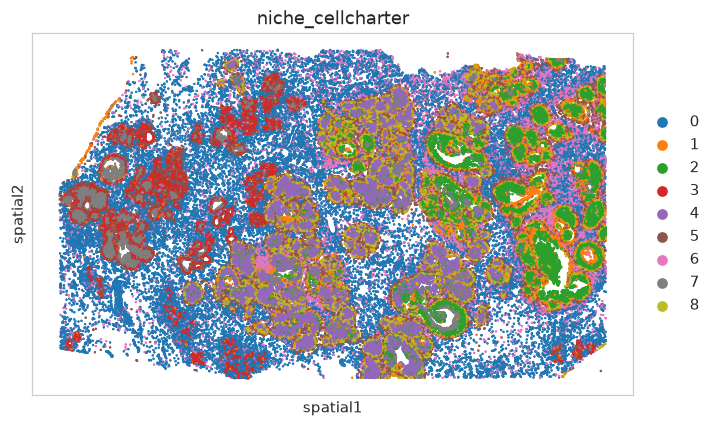

In [21]:
sq.pl.spatial_scatter(
    adata, 
    library_id='region',
    color="niche_cellcharter", 
    shape=None, 
    img=False,
    size=1 
)

### 4.2 Niche characterization

Characterize the spatial domains from 4.1 two ways:

- **Composition** — cell-type mixture per niche (from Section 3 labels).
- **Function** — mean pathway/program score per niche, via
  `rsc.dcg.ulm` on a small set of illustrative functional gene
  programs (proliferation, hypoxia, EMT, immune checkpoint,
  interferon response).

cell_type,Fibroblast_CAF,LumHR_Epithelial,Myeloid,Pericyte_Perivascular,Plasma_Cell,T_Cell,Tumor_Basal_like_DCIS,Tumor_Invasive_11q13amp,Tumor_Luminal_like_DCIS,Vascular_Endothelial
niche_cellcharter,,,,,,,,,,
0,67.4,0.0,0.1,11.1,0.0,0.3,0.1,3.4,0.0,17.7
1,4.3,0.4,20.0,0.2,0.0,10.8,4.2,59.4,0.0,0.6
2,0.0,0.0,0.1,0.0,0.0,0.0,0.0,99.9,0.0,0.0
3,0.0,40.1,0.0,0.0,0.0,0.0,9.1,47.8,2.9,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.1,99.9,0.0,0.0
5,50.9,0.0,0.5,10.6,0.1,0.3,0.2,7.5,0.0,29.8
6,1.4,0.0,30.9,0.0,7.3,50.9,3.2,6.2,0.0,0.0
7,0.0,52.1,0.3,0.0,0.0,0.0,27.5,20.1,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0


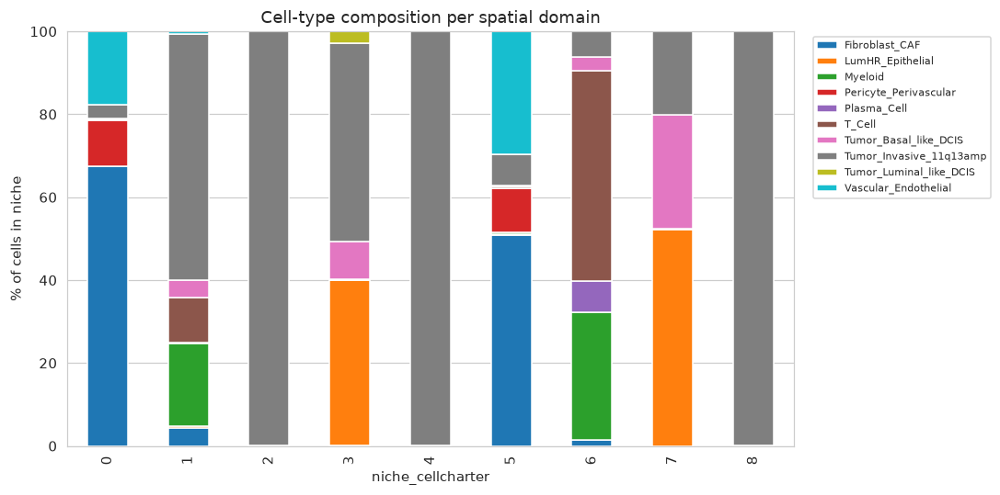

In [22]:
composition = (
    pd.crosstab(adata.obs["niche_cellcharter"], adata.obs["cell_type"], normalize="index") * 100
)

fig, ax = plt.subplots(figsize=(10, 5))
composition.plot(kind="bar", stacked=True, ax=ax)
ax.set_ylabel("% of cells in niche")
ax.set_title(f"Cell-type composition per spatial domain")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=7)
fig.tight_layout()

composition.round(1)

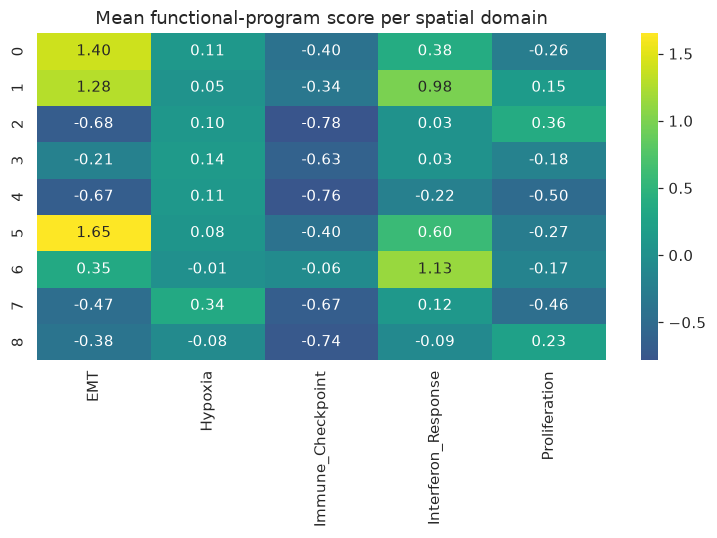

In [23]:
FUNCTIONAL_PROGRAMS: dict[str, list[str]] = {
    "Proliferation": ["MKI67", "TOP2A", "NCAPG2", "ESPL1", "MELK"],  # incl. poster's mitotic-signature genes
    "Hypoxia": ["VEGFA", "HIF1A", "CA9", "SLC2A1", "NDRG1"],
    "EMT": ["VIM", "CDH2", "SNAI2", "ZEB1", "FN1"],
    "Immune_Checkpoint": ["PDCD1", "CD274", "CTLA4", "LAG3", "HAVCR2"],
    "Interferon_Response": ["STAT1", "IRF1", "ISG15", "MX1"],
}

functional_net = (
    pd.Series(FUNCTIONAL_PROGRAMS).explode().rename_axis("source").reset_index(name="target")
)

rsc.dcg.ulm(adata, functional_net, layer="lognorm", tmin=2)
adata.obsm["score_functional"] = adata.obsm.pop("score_ulm")
adata.obsm.pop("padj_ulm", None)
score_fn = adata.obsm["score_functional"]

niche_functional = score_fn.groupby(adata.obs["niche_cellcharter"].values).mean()

fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(niche_functional, cmap="viridis", center=0, annot=True, fmt=".2f", ax=ax)
ax.set_title("Mean functional-program score per spatial domain")
fig.tight_layout()

### 4.3 Spatial structure metrics: 

co-occurrence, neighborhood enrichment, ligand-receptor signaling

Three classic squidpy-style analyses, complementary to the niches
above (which summarize *local neighborhoods*; these instead
summarize *pairwise* spatial relationships between cell types):

- **`rsc.gr.co_occurrence`** — GPU. For each cell-type pair, how does
  the probability of finding the second type change with distance
  from the first? We highlight the hypoxic-tumor state against
  immune/stromal types.
- **`squidpy.gr.nhood_enrichment`** — CPU (no `rsc.gr` equivalent
  yet). Permutation test for whether cell-type pairs are spatial
  neighbors more/less often than chance, summarized as a z-score
  matrix.
- **`rsc.gr.ligrec`** — GPU. Squidpy-style permutation test for
  ligand–receptor pairs enriched between cluster pairs. We supply a
  small, explicit immune/tumor-relevant `interactions` table rather
  than the OmniPath-backed default (`interactions=None`), since the
  default requires the `omnipath` package + network access to fetch
  its interaction database. 

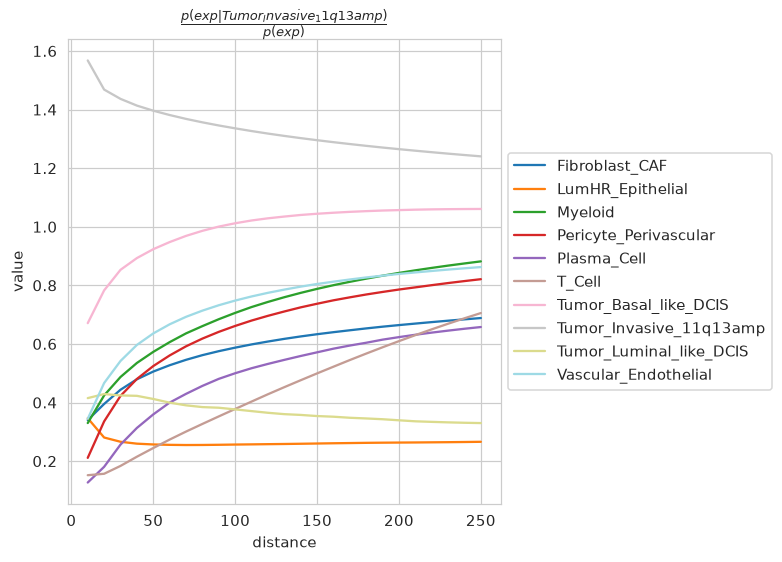

In [24]:
categories = adata.obs["cell_type"].cat.categories

rsc.gr.co_occurrence(
    adata,
    cluster_key="cell_type",
    interval=np.linspace(0, 250, 26),
    multi_gpu=False,
)
tumor_cats = [c for c in categories if c.startswith("Tumor")]
focal = adata.obs["cell_type"].value_counts()[tumor_cats].idxmax()
sq.pl.co_occurrence(
    adata,
    cluster_key="cell_type",
    clusters=focal,
    figsize=(7, 5),
)

  0%|          | 0/500 [00:00<?, ?/s]

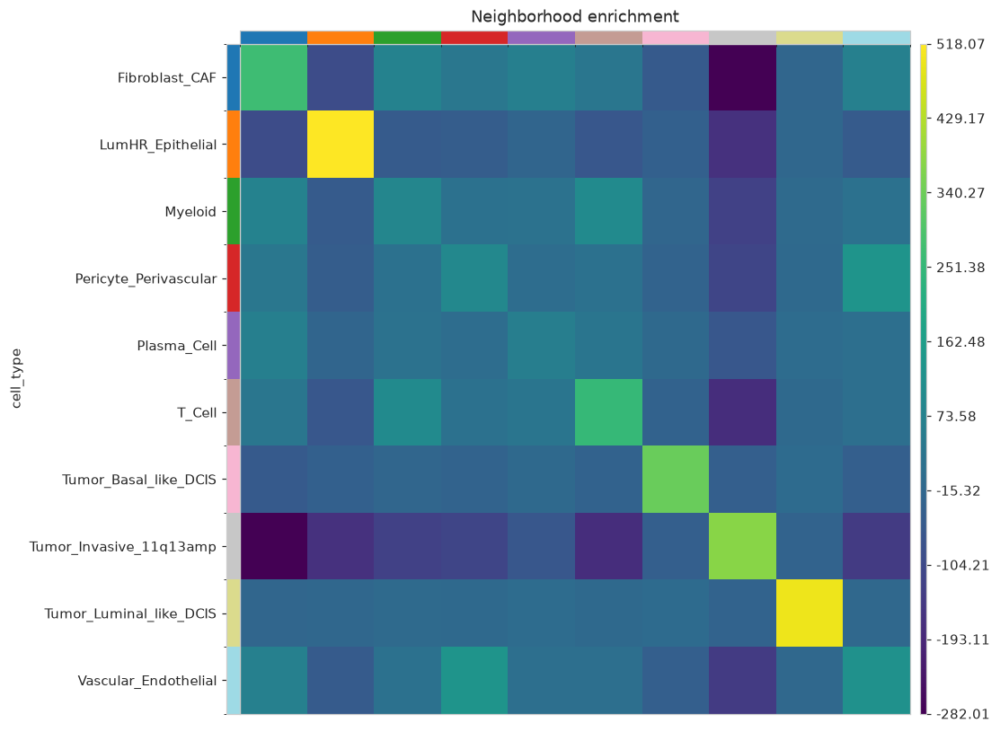

In [25]:
# No rsc.gr equivalent yet -- CPU squidpy, reuses the same
# obsp["spatial_connectivities"] graph above.
sq.gr.nhood_enrichment(adata, cluster_key="cell_type", n_perms=500, seed=RANDOM_STATE)
sq.pl.nhood_enrichment(adata, cluster_key="cell_type", figsize=(8, 7))

/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_ligrec.py:327: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[0, np.float64(nan), np.float64(nan)]'. Picking the first and converting the rest.
  adata = AnnData(pvals.values, obs={"groups": pd.Categorical(pvals.index)}, var=var)
/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/scanpy/plotting/_dotplot.py:848: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[0, np.float64(nan), np.float64(nan)]'. Picking the first and converting the rest.
  frac = dot_size.values.flatten()
/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_ligrec.py:406: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[0, np.float64(nan), np.float64(nan)]'. Picking the first and converting the rest.
  yy, xx = np.where((pvals.values + alpha) >= -np.log10(alpha))


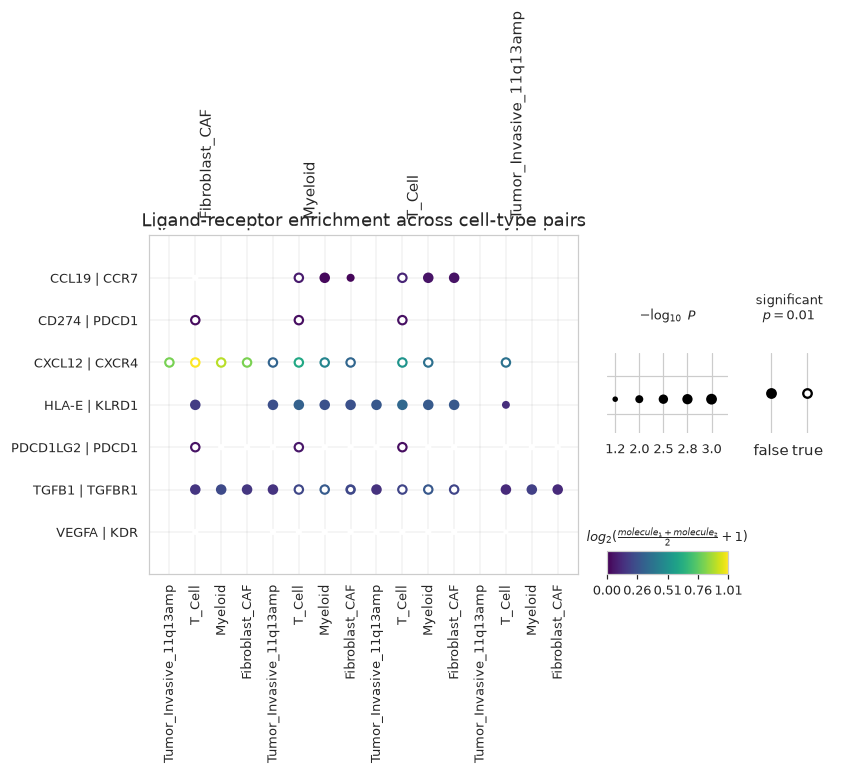

In [26]:
LR_PAIRS = pd.DataFrame({
    "source": ["CD274", "PDCD1LG2", "CXCL12", "VEGFA", "TGFB1", "CCL19", "HLA-E"],
    "target": ["PDCD1", "PDCD1",   "CXCR4",  "KDR",   "TGFBR1", "CCR7", "KLRD1"],
})

adata_lr = adata.copy()
adata_lr.X = adata_lr.layers["lognorm"]
adata_lr.obs["cell_type"] = adata_lr.obs["cell_type"].cat.remove_unused_categories()
rsc.get.anndata_to_CPU(adata_lr, convert_all=True)  # ligrec needs host-resident X, see markdown above

ligrec_res = rsc.gr.ligrec(
    adata_lr, cluster_key="cell_type", interactions=LR_PAIRS,
    use_raw=False, n_perms=1000, threshold=0.01, copy=True,
)
del adata_lr

preferred_lr_clusters = [
    "Tumor_Hypoxic", "Tumor_Invasive_11q13amp", "T_Cell", "B_Cell", "Myeloid", "Fibroblast_CAF",
]
lr_clusters = [c for c in preferred_lr_clusters if c in categories]
if len(lr_clusters) < 2:  # fall back to the largest actually-assigned categories
    lr_clusters = list(adata.obs["cell_type"].value_counts().index[:6])

sq.pl.ligrec(
    ligrec_res, 
    source_groups=lr_clusters, 
    target_groups=lr_clusters,
    alpha=0.01, 
    title="Ligand-receptor enrichment across cell-type pairs",
    figsize=(0.7 * len(lr_clusters) + 4, 4),
)

## 5. Spatially variable genes & gene-level tasks

Spatially variable gene (SVG) detection via Moran's I,
`rsc.gr.spatial_autocorr(..., mode="moran")` — the GPU-accelerated
drop-in for `squidpy.gr.spatial_autocorr`. Restricted to HVGs to keep
runtime reasonable on 170k cells; drop the HVG restriction to score
the full panel.

In [27]:
hvg_mask = adata.var["highly_variable"].to_numpy()

lognorm_cpu = adata.layers["lognorm"].get()  # CuPy sparse -> host once
adata_hvg = ad.AnnData(
    X=lognorm_cpu[:, hvg_mask],
    obs=adata.obs.copy(),
    var=adata.var.loc[hvg_mask].copy(),
    obsm={"spatial": adata.obsm["spatial"]},
)
adata_hvg.layers["lognorm"] = adata_hvg.X
adata_hvg.obsp["spatial_connectivities"] = adata.obsp["spatial_connectivities"]
rsc.get.anndata_to_GPU(adata_hvg, convert_all=True)

moran_df = rsc.gr.spatial_autocorr(adata_hvg, mode="moran", layer="lognorm", copy=True)
moran_df = moran_df.sort_values("I", ascending=False)
moran_df.head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
CCND1,0.729848,0.0,0.000002,0.0
ELAPOR1,0.686595,0.0,0.000002,0.0
TAT,0.644999,0.0,0.000002,0.0
MSMB,0.635660,0.0,0.000002,0.0
TFF1,0.608555,0.0,0.000002,0.0
TFF3,0.607827,0.0,0.000002,0.0
PLAT,0.594066,0.0,0.000002,0.0
STC2,0.593282,0.0,0.000002,0.0
AGR3,0.580911,0.0,0.000002,0.0
PRPF19,0.580698,0.0,0.000002,0.0


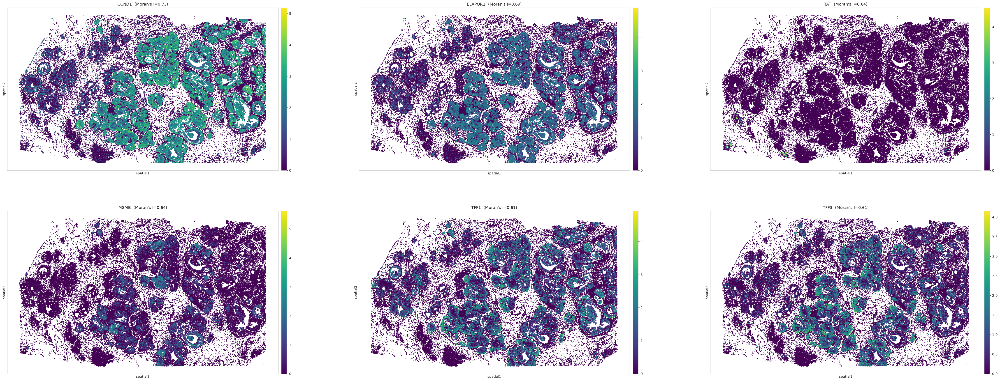

In [ ]:
top_svgs = moran_df.index[:6].tolist()

rsc.get.anndata_to_CPU(adata_hvg, convert_all=True)

titles = {g: f"{g}  (Moran's I={moran_df.loc[g, 'I']:.2f})" for g in top_svgs}
axes = sq.pl.spatial_scatter(
    adata_hvg, 
    library_id='region',
    color=top_svgs, 
    layer="lognorm", 
    shape=None, 
    img=False,
    cmap="viridis", 
    size=1.5, 
    ncols=3, 
    figsize=(15, 9), 
    return_ax=True,
)
for ax, gene in zip(np.atleast_1d(axes), top_svgs):
    ax.set_title(titles[gene])

## 6. Visualization strategies

A short gallery of the view types most useful for this kind of
dataset. Plotting itself stays on matplotlib/scanpy/spatialdata-plot
(squidpy_gpu is compute-only, no GPU plotting layer).

- **QC/segmentation diagnostics**: histograms + spatial scatter of
  per-cell covariates (Section 1).
- **Embeddings**: UMAP colored by cluster / cell type (Section 3).
- **Spatial domains**: scatter colored by niche/domain id (Section 4.1).
- **Composition / cross-checks**: stacked bars + niche functional
  heatmap (Section 4.2).
- **Pairwise spatial relationships**: co-occurrence curves,
  neighborhood-enrichment heatmap, ligand-receptor heatmap (4.3).
- **Gene panels**: spatial scatter of top SVGs (Section 5).
- **Zoomed tissue regions** (below): full-resolution morphology image
  + cell boundaries via `spatialdata-plot`, in the style of the
  poster's zoomed DCIS-region figures.

/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_spatial_utils.py:979: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/squidpy/pl/_spatial_utils.py:979: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


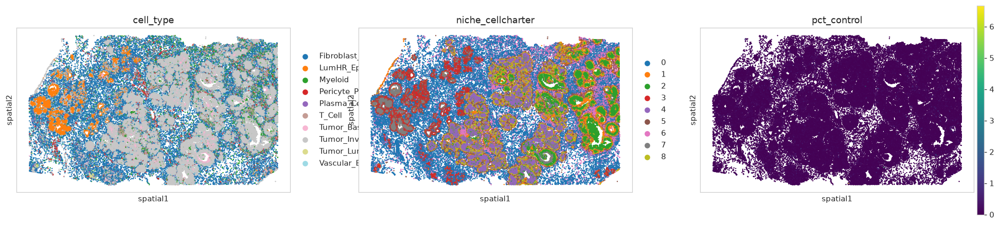

In [29]:
sq.pl.spatial_scatter(
    adata, 
    library_id='region',
    color=["cell_type", "niche_cellcharter", "pct_control"],
    shape=None, 
    img=False, 
    cmap="viridis",
    ncols=3
)

### Zoomed tissue regions (`spatialdata-plot`)

Two contrasting DCIS (ductal carcinoma in situ) growth patterns within the same tumor: a **"structured"** nest (basal-like progenitor markers `KIT`/`PROM1`) and an
**"amorphous"** nest (luminal-like, ER-positive markers
`ANKRD30A`/`ESR1`). We look for data-driven coordinates: we use the
per-cell `dcg.ulm` scores from Section 3 to find where each
substate is locally most concentrated, then crop and render that
neighborhood with the `SpatialData` object built in Section 0
(morphology image + cell boundary polygons).

In [ ]:
adata_viz = adata.copy()
rsc.get.anndata_to_CPU(adata_viz, convert_all=True)
sdata.tables["table"] = adata_viz
coords = adata.obsm['spatial']
# cell_boundaries/table live in "microns"; the shared 'global' coordinate system spatialdata-plot renders in is in image-pixel units -- convert.
SCALE_UM_TO_GLOBAL = float(
    sd.transformations.get_transformation(sdata["cell_boundaries"], "global").scale[0]
)


def crop_um(sdata, center_um, radius_um=200):
    cx, cy = center_um
    lo = [(cx - radius_um) * SCALE_UM_TO_GLOBAL, (cy - radius_um) * SCALE_UM_TO_GLOBAL]
    hi = [(cx + radius_um) * SCALE_UM_TO_GLOBAL, (cy + radius_um) * SCALE_UM_TO_GLOBAL]
    return sdata.query.bounding_box(
        axes=("x", "y"), min_coordinate=lo, max_coordinate=hi,
        target_coordinate_system="global", filter_table=True,
    )


def find_hotspot(score, coords, bin_um=100, min_cells=10):
    """Coarse-grid the tissue and return the centroid of the highest-mean-score bin."""
    gx = (coords[:, 0] // bin_um).astype(int)
    gy = (coords[:, 1] // bin_um).astype(int)
    df = pd.DataFrame({"gx": gx, "gy": gy, "score": score, "x": coords[:, 0], "y": coords[:, 1]})
    grouped = df.groupby(["gx", "gy"]).agg(mean_score=("score", "mean"), n=("score", "size"))
    grouped = grouped[grouped["n"] >= min_cells]
    best = grouped["mean_score"].idxmax()
    sub = df[(df["gx"] == best[0]) & (df["gy"] == best[1])]
    return float(sub["x"].mean()), float(sub["y"].mean())


structured_center = find_hotspot(adata.obsm["score_celltype"]["Tumor_Basal_like_DCIS"].to_numpy(), coords)
amorphous_center = find_hotspot(adata.obsm["score_celltype"]["Tumor_Luminal_like_DCIS"].to_numpy(), coords)
print("structured (basal-like DCIS) hotspot (µm):", structured_center)
print("amorphous (luminal-like DCIS) hotspot (µm):", amorphous_center)

structured (basal-like DCIS) hotspot (µm): (8556.467985222138, 2553.1783579631024)
amorphous (luminal-like DCIS) hotspot (µm): (1070.4620544433594, 2020.2044311523437)


/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/pims/tiff_stack.py:131: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  data = t.asarray()
/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/pims/tiff_stack.py:131: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  data = t.asarray()
/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/pims/tiff_stack.py:131: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  data = t.asarray()


/home/lheumos/miniforge3/envs/scverse/lib/python3.14/site-packages/pims/tiff_stack.py:131: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  data = t.asarray()
/tmp/ipykernel_2335321/3243117739.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


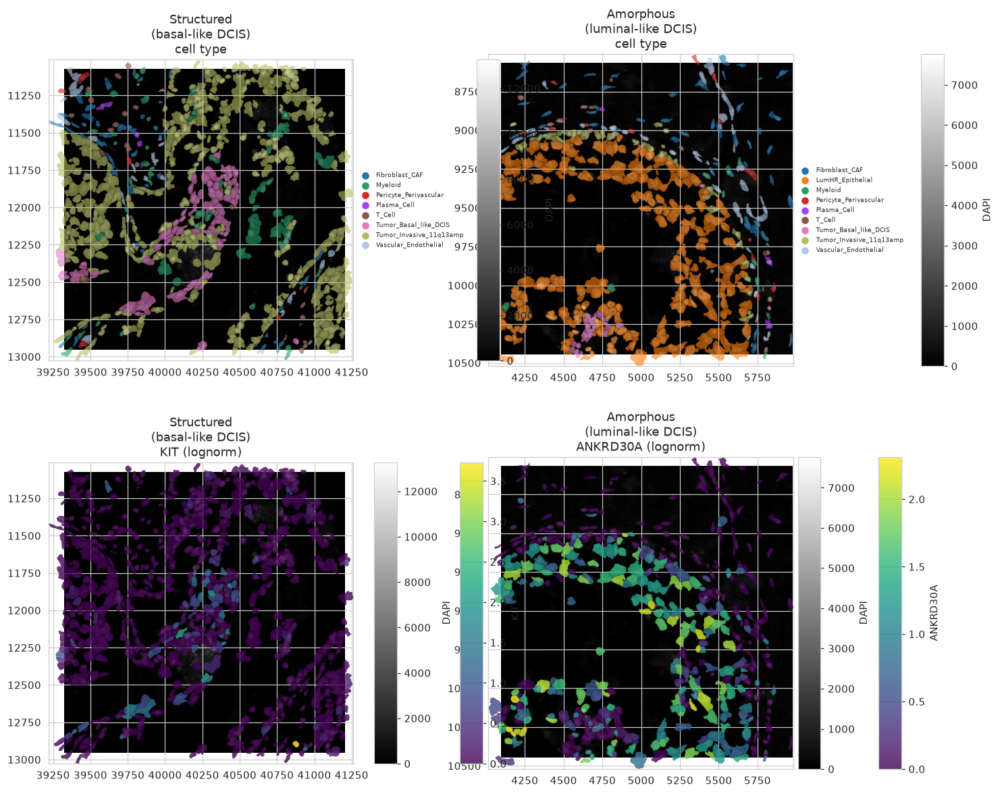

In [31]:
zoom_regions = {
    "Structured\n(basal-like DCIS)": (structured_center, "KIT"),
    "Amorphous\n(luminal-like DCIS)": (amorphous_center, "ANKRD30A"),
}

fig, axes = plt.subplots(2, 2, figsize=(12, 11))
for col, (title, (center, gene)) in enumerate(zoom_regions.items()):
    cropped = crop_um(sdata, center, radius_um=200)

    cropped.pl.render_images("morphology_focus", channel="DAPI", cmap="gray").pl.render_shapes(
        "cell_boundaries", color="cell_type", table_name="table", fill_alpha=0.6
    ).pl.show(ax=axes[0, col], title=f"{title}\ncell type", legend_fontsize=6)

    cropped.pl.render_images("morphology_focus", channel="DAPI", cmap="gray").pl.render_shapes(
        "cell_boundaries", color=gene, table_name="table", table_layer="lognorm",
        cmap="viridis", fill_alpha=0.8,
    ).pl.show(ax=axes[1, col], title=f"{title}\n{gene} (lognorm)")

fig.tight_layout()

### Hand off to the interactive viewer

`09_spatial_atera_interactive_viewer.ipynb` renders this annotated object as a linked [Vitessce](http://vitessce.io/) viewer: morphology image, cell boundaries, UMAP, cell sets and gene expression in one layout.
It starts from the AnnData written below, and re-reads image and boundaries from the same `outs/` bundle.

In [32]:
ANNOTATED_H5AD = DATA_ROOT / "atera_annotated.h5ad"

adata_viz.write_h5ad(ANNOTATED_H5AD)
print(f"Wrote {ANNOTATED_H5AD}")

Wrote data/atera/atera_annotated.h5ad
